In [1]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import keras
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings('ignore')

#Problem-1)

Predict turbine energy yield (TEY) using ambient variables as features.


*  The dataset contains 36733 instances of 11 sensor measures aggregated over one hour (by means of average or sum) from a gas turbine. 

*  The Dataset includes gas turbine parameters (such as Turbine Inlet Temperature and Compressor Discharge pressure) in addition to the ambient variables.

**Attribute Information:**

The explanations of sensor measurements and their brief statistics are given below.

Variable (Abbr.) Unit Min Max Mean

Ambient temperature (AT) C â€“6.23 37.10 17.71

Ambient pressure (AP) mbar 985.85 1036.56 1013.07

Ambient humidity (AH) (%) 24.08 100.20 77.87

Air filter difference pressure (AFDP) mbar 2.09 7.61 3.93

Gas turbine exhaust pressure (GTEP) mbar 17.70 40.72 25.56

Turbine inlet temperature (TIT) C 1000.85 1100.89 1081.43

Turbine after temperature (TAT) C 511.04 550.61 546.16

Compressor discharge pressure (CDP) mbar 9.85 15.16 12.06

Turbine energy yield (TEY) MWH 100.02 179.50 133.51

Carbon monoxide (CO) mg/m3 0.00 44.10 2.37

Nitrogen oxides (NOx) mg/m3 25.90 119.91 65.29

#Solution:

In [2]:
gas_turbs=pd.read_csv('gas_turbines.csv')
gas_turbs

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,6.8594,1007.9,96.799,3.5000,19.663,1059.2,550.00,114.70,10.605,3.1547,82.722
1,6.7850,1008.4,97.118,3.4998,19.728,1059.3,550.00,114.72,10.598,3.2363,82.776
2,6.8977,1008.8,95.939,3.4824,19.779,1059.4,549.87,114.71,10.601,3.2012,82.468
3,7.0569,1009.2,95.249,3.4805,19.792,1059.6,549.99,114.72,10.606,3.1923,82.670
4,7.3978,1009.7,95.150,3.4976,19.765,1059.7,549.98,114.72,10.612,3.2484,82.311
...,...,...,...,...,...,...,...,...,...,...,...
15034,9.0301,1005.6,98.460,3.5421,19.164,1049.7,546.21,111.61,10.400,4.5186,79.559
15035,7.8879,1005.9,99.093,3.5059,19.414,1046.3,543.22,111.78,10.433,4.8470,79.917
15036,7.2647,1006.3,99.496,3.4770,19.530,1037.7,537.32,110.19,10.483,7.9632,90.912
15037,7.0060,1006.8,99.008,3.4486,19.377,1043.2,541.24,110.74,10.533,6.2494,93.227


##Basic & EDA

In [3]:
gas_turbs.shape

(15039, 11)

In [4]:
gas_turbs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15039 entries, 0 to 15038
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      15039 non-null  float64
 1   AP      15039 non-null  float64
 2   AH      15039 non-null  float64
 3   AFDP    15039 non-null  float64
 4   GTEP    15039 non-null  float64
 5   TIT     15039 non-null  float64
 6   TAT     15039 non-null  float64
 7   TEY     15039 non-null  float64
 8   CDP     15039 non-null  float64
 9   CO      15039 non-null  float64
 10  NOX     15039 non-null  float64
dtypes: float64(11)
memory usage: 1.3 MB


* Datatypes of all features are correct.

In [5]:
gas_turbs.isna().sum()

AT      0
AP      0
AH      0
AFDP    0
GTEP    0
TIT     0
TAT     0
TEY     0
CDP     0
CO      0
NOX     0
dtype: int64

*  There are no null values in the given dataset. 

In [6]:
gas_turbs.duplicated().value_counts()

False    15039
dtype: int64

*  There are no duplicate records in the given dataset. 

In [7]:
gas_turbs.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,15039.000000,15039.00000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000
mean,17.764381,1013.19924,79.124174,4.200294,25.419061,1083.798770,545.396183,134.188464,12.102353,1.972499,68.190934
std,7.574323,6.41076,13.793439,0.760197,4.173916,16.527806,7.866803,15.829717,1.103196,2.222206,10.470586
min,0.522300,985.85000,30.344000,2.087400,17.878000,1000.800000,512.450000,100.170000,9.904400,0.000388,27.765000
25%,11.408000,1008.90000,69.750000,3.723900,23.294000,1079.600000,542.170000,127.985000,11.622000,0.858055,61.303500
50%,18.186000,1012.80000,82.266000,4.186200,25.082000,1088.700000,549.890000,133.780000,12.025000,1.390200,66.601000
75%,23.862500,1016.90000,90.043500,4.550900,27.184000,1096.000000,550.060000,140.895000,12.578000,2.160400,73.935500
max,34.929000,1034.20000,100.200000,7.610600,37.402000,1100.800000,550.610000,174.610000,15.081000,44.103000,119.890000


In [8]:
# number of distinct values in each feature
for i, column in enumerate(gas_turbs.columns, 1):
  print('Distinct values in feature ',gas_turbs[column].name,' are ',gas_turbs[column].nunique())

Distinct values in feature  AT  are  12086
Distinct values in feature  AP  are  540
Distinct values in feature  AH  are  12637
Distinct values in feature  AFDP  are  11314
Distinct values in feature  GTEP  are  8234
Distinct values in feature  TIT  are  706
Distinct values in feature  TAT  are  2340
Distinct values in feature  TEY  are  4207
Distinct values in feature  CDP  are  3611
Distinct values in feature  CO  are  13096
Distinct values in feature  NOX  are  11996


## Visualizing data points

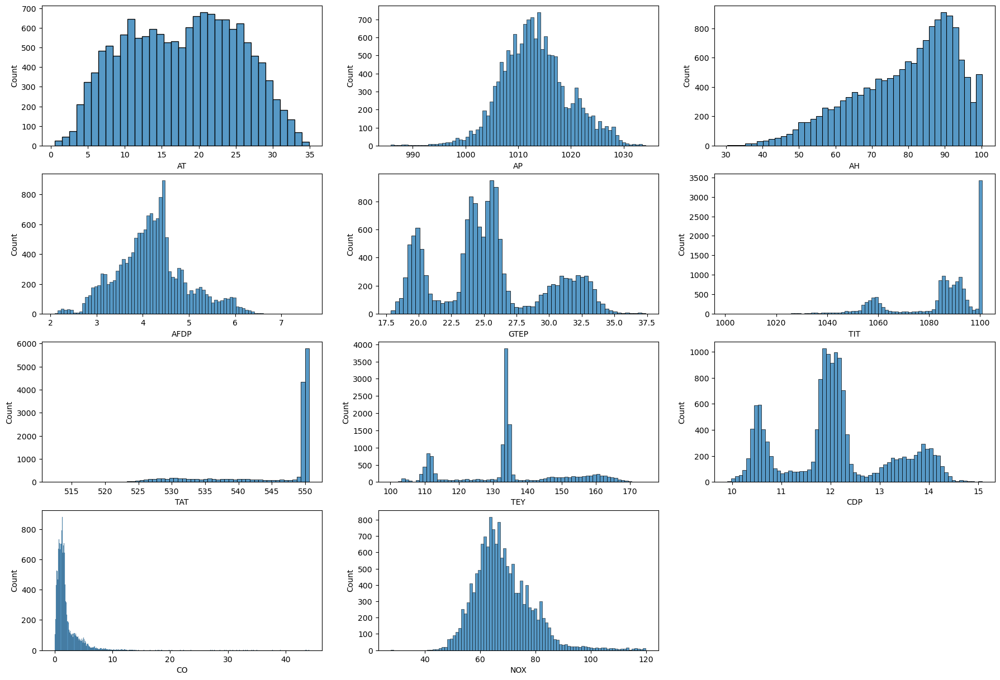

In [9]:
#plotting histplots to observe datapoints nature
plt.figure(figsize=(22,15))
for i, column in enumerate(gas_turbs.columns, 1):
    plt.subplot(4,3,i)
    sns.histplot(gas_turbs[column])

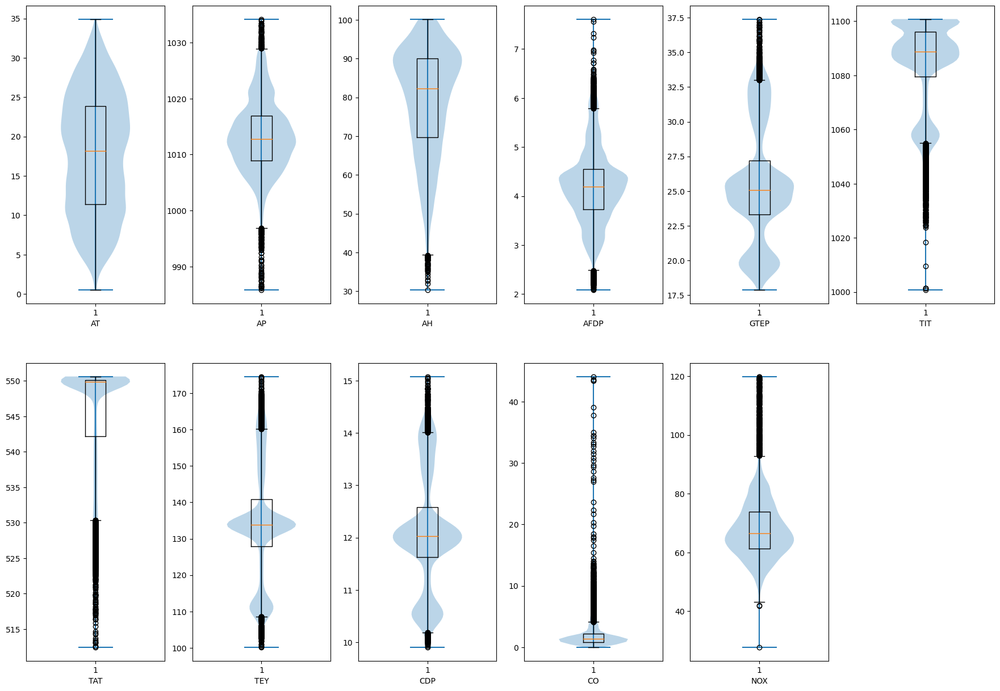

In [10]:
#plotting boxplots to observe datapoints nature
plt.figure(figsize=(22,15))
for i, column in enumerate(gas_turbs.columns, 1):
    plt.subplot(2,6,i)
  
    plt.violinplot(gas_turbs[column])
    plt.boxplot(gas_turbs[column])
    plt.xlabel(gas_turbs[column].name)

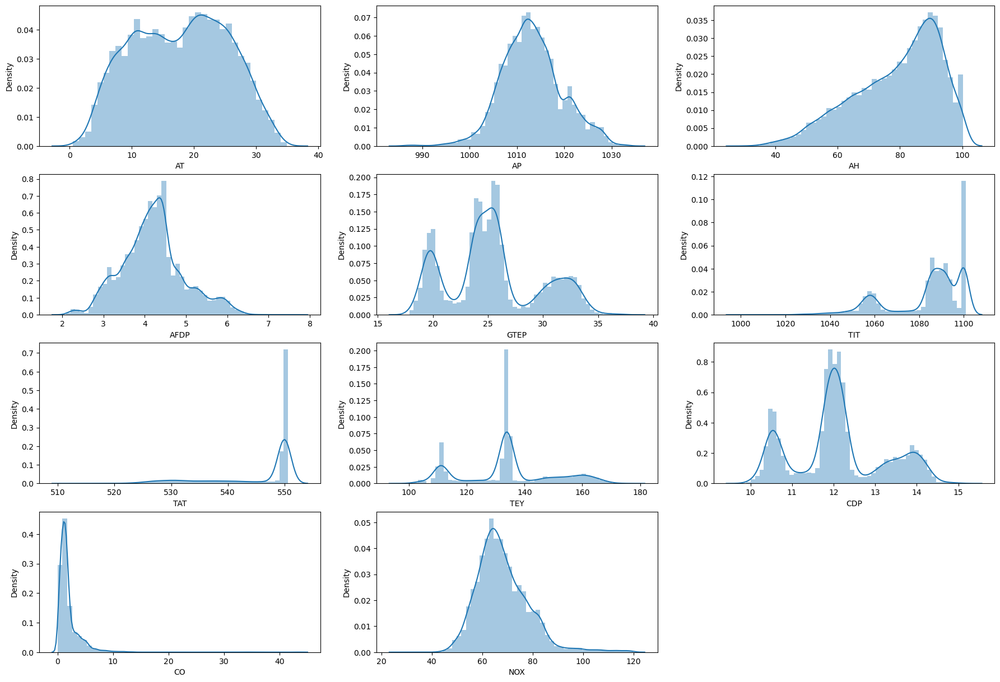

In [11]:
#plotting distplots to observe datapoints nature
plt.figure(figsize=(22,15))
for i, column in enumerate(gas_turbs.columns, 1):
    plt.subplot(4,3,i)
    sns.distplot(gas_turbs[column])

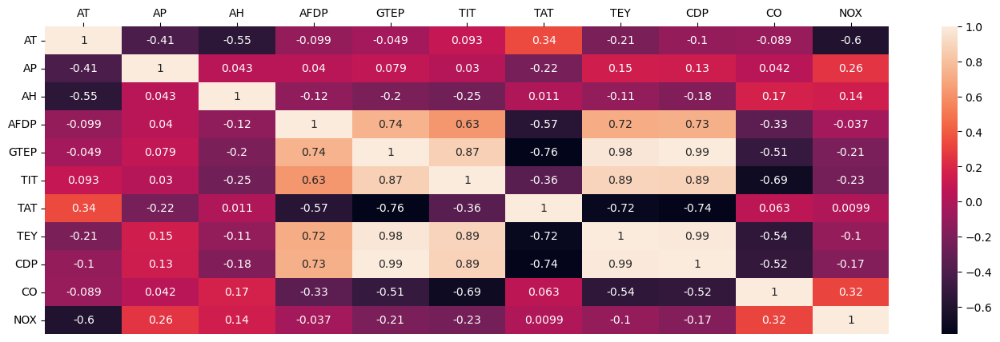

In [12]:
#plotting the heatmap for correlation
plt.figure(figsize=(17,5))
ax = sns.heatmap(gas_turbs.corr(), annot=True)
ax.xaxis.tick_top()

<Figure size 2000x1000 with 0 Axes>

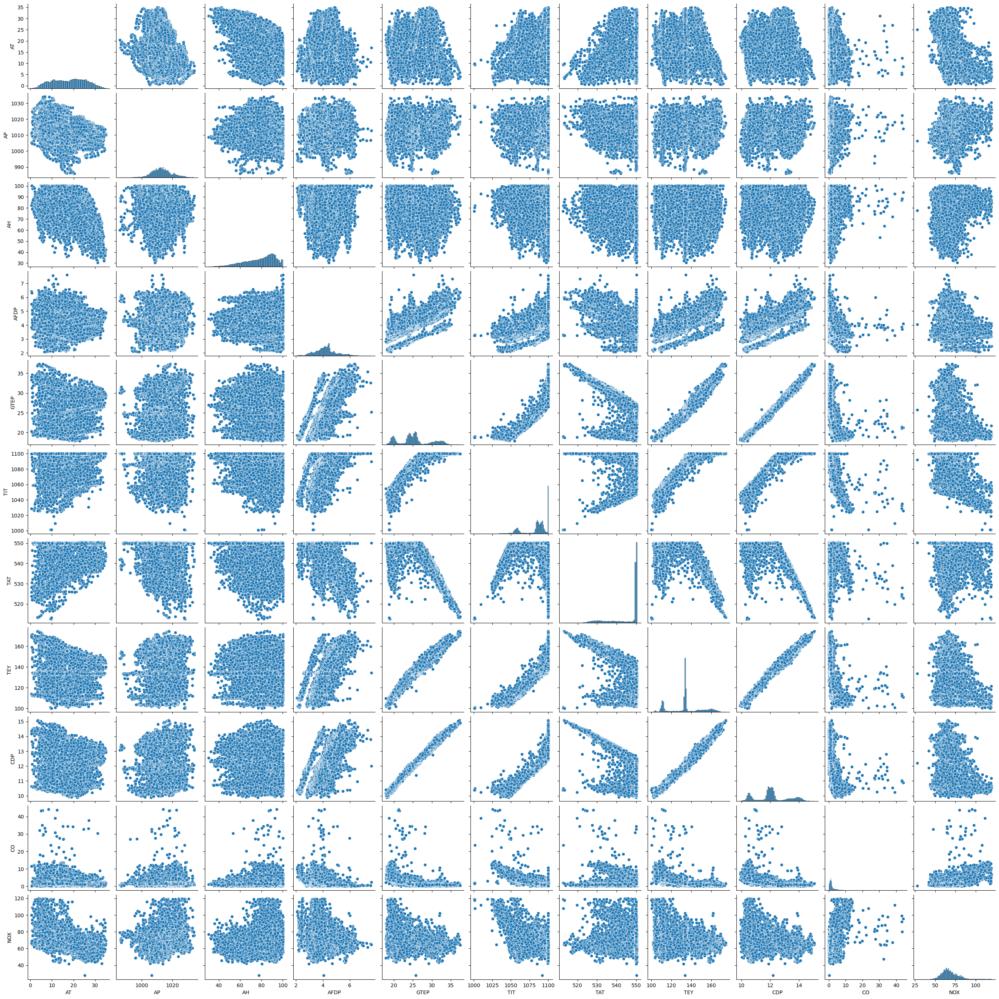

In [13]:
#pairplot
plt.figure(figsize=(20,10))
sns.pairplot(gas_turbs)
plt.show()

##standardising data

In [14]:
std=StandardScaler()
gas_turbstd=gas_turbs.copy()
std.fit_transform(gas_turbstd)

array([[-1.4397781 , -0.82664395,  1.28143632, ..., -1.35733078,
         0.53201195,  1.3878449 ],
       [-1.44960109, -0.74864748,  1.30456402, ..., -1.36367619,
         0.56873344,  1.39300237],
       [-1.43472138, -0.68625031,  1.21908576, ..., -1.36095673,
         0.5529378 ,  1.36358566],
       ...,
       [-1.38626659, -1.07623263,  1.47697056, ..., -1.46792219,
         2.69592467,  2.17006209],
       [-1.42042259, -0.99823616,  1.44159024, ..., -1.42259784,
         1.9246834 ,  2.391165  ],
       [-1.43073409, -0.93583899,  1.33465179, ..., -1.37727349,
         1.35415028,  2.32153907]])

In [15]:

gas_turbstd=pd.DataFrame(std.fit_transform(gas_turbstd),columns=gas_turbs.columns)
gas_turbstd

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,-1.439778,-0.826644,1.281436,-0.921232,-1.379101,-1.488376,0.585240,-1.231172,-1.357331,0.532012,1.387845
1,-1.449601,-0.748647,1.304564,-0.921495,-1.363528,-1.482325,0.585240,-1.229909,-1.363676,0.568733,1.393002
2,-1.434721,-0.686250,1.219086,-0.944385,-1.351309,-1.476275,0.568715,-1.230541,-1.360957,0.552938,1.363586
3,-1.413702,-0.623853,1.169060,-0.946884,-1.348194,-1.464173,0.583969,-1.229909,-1.356424,0.548933,1.382878
4,-1.368693,-0.545857,1.161883,-0.924389,-1.354663,-1.458123,0.582698,-1.229909,-1.350985,0.574179,1.348591
...,...,...,...,...,...,...,...,...,...,...,...
15034,-1.153182,-1.185428,1.401860,-0.865850,-1.498657,-2.063184,0.103453,-1.426381,-1.543161,1.145792,1.085751
15035,-1.303986,-1.138630,1.447753,-0.913470,-1.438759,-2.268905,-0.276638,-1.415642,-1.513247,1.293578,1.119943
15036,-1.386267,-1.076233,1.476971,-0.951488,-1.410967,-2.789257,-1.026650,-1.516089,-1.467922,2.695925,2.170062
15037,-1.420423,-0.998236,1.441590,-0.988848,-1.447624,-2.456474,-0.528337,-1.481343,-1.422598,1.924683,2.391165


##Splitting data for testing

In [16]:
x=gas_turbstd.drop('TEY',axis=1)
y=gas_turbstd['TEY']

In [17]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)
x_train.shape, x_test.shape,y_train.shape, y_test.shape

((10076, 10), (4963, 10), (10076,), (4963,))

## **Tuning of Hyperparameters :-** 

1.   Batch Size
2.   Epochs

In [18]:
# libs
import tensorflow
from sklearn.model_selection import GridSearchCV,KFold
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
#optimizers
from keras.optimizers import adam
from tensorflow.keras.optimizers import Adam

In [19]:
#model def creation
def create_model():
    model = Sequential(name='Hypterparameter-Tuning-Dummy')
    model.add(Dense(12, input_dim=10, kernel_initializer='uniform', activation='relu'))
    model.add(Dense(8,kernel_initializer='uniform', activation='relu'))
    model.add(Dense(1, kernel_initializer='uniform', activation='sigmoid'))
    
    adam=Adam(learning_rate=0.01)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    return model

In [20]:
#model
model=KerasClassifier(build_fn=create_model,verbose=0)
#hyper param 
batch_size=[20,40]
epochs=[100,200]
# Make a dictionary of the grid search parameters
param_grid = dict(batch_size = batch_size,epochs = epochs)
# Build and fit the GridSearchCV
grid = GridSearchCV(estimator = model,param_grid = param_grid,cv = KFold(),verbose = 10)
grid_result = grid.fit(x,y)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START batch_size=20, epochs=100...................................
[CV 1/5; 1/4] END ....batch_size=20, epochs=100;, score=0.000 total time= 2.1min
[CV 2/5; 1/4] START batch_size=20, epochs=100...................................
[CV 2/5; 1/4] END ....batch_size=20, epochs=100;, score=0.000 total time= 2.5min
[CV 3/5; 1/4] START batch_size=20, epochs=100...................................
[CV 3/5; 1/4] END ....batch_size=20, epochs=100;, score=0.000 total time= 2.3min
[CV 4/5; 1/4] START batch_size=20, epochs=100...................................
[CV 4/5; 1/4] END ....batch_size=20, epochs=100;, score=0.000 total time= 2.2min
[CV 5/5; 1/4] START batch_size=20, epochs=100...................................
[CV 5/5; 1/4] END ....batch_size=20, epochs=100;, score=0.000 total time= 2.0min
[CV 1/5; 2/4] START batch_size=20, epochs=200...................................
[CV 1/5; 2/4] END ....batch_size=20, epochs=200;,

In [21]:
#summarizing results
print('Best:{},using{}'.format(grid_result.best_score_,grid_result.best_params_))
means=grid_result.cv_results_['mean_test_score']
stds=grid_result.cv_results_['std_test_score']
params=grid_result.cv_results_['params']
for mean,stdev,param in zip(means,stds,params):
  print('{},{} with:{}'.format(mean,stdev,param))

Best:0.0,using{'batch_size': 20, 'epochs': 100}
0.0,0.0 with:{'batch_size': 20, 'epochs': 100}
0.0,0.0 with:{'batch_size': 20, 'epochs': 200}
0.0,0.0 with:{'batch_size': 40, 'epochs': 100}
0.0,0.0 with:{'batch_size': 40, 'epochs': 200}


## Tuning of Hyperparameters:- Learning rate and Drop out rate

In [22]:
from keras.layers import Dropout
#model def
def create_model(learning_rate,dropout_rate):
  model=Sequential()
  model.add(Dense(8,input_dim=10,kernel_initializer='normal',activation='relu'))
  model.add(Dropout(dropout_rate))
  model.add(Dense(12,input_dim=8,kernel_initializer='normal',activation='relu'))
  model.add(Dropout(dropout_rate))
  model.add(Dense(1,activation='sigmoid'))

  adam=Adam(learning_rate=learning_rate)
  model.compile(loss='binary_crossentropy',optimizer=adam,metrics=['accuracy'])
  return model

#model creation
model=KerasClassifier(build_fn=create_model,verbose=0,batch_size=40,epochs=50)
#grid search params
learning_rate=[0.001,0.01,0.1]
dropout_rate=[0.0,0.1,0.2]
#grid search dictionary
param_grids=dict(learning_rate=learning_rate,dropout_rate=dropout_rate)

#gridsearch cv fit
grid=GridSearchCV(estimator=model,param_grid=param_grids,cv=KFold(),verbose=10)
grid_result=grid.fit(x,y)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5; 1/9] START dropout_rate=0.0, learning_rate=0.001.......................
[CV 1/5; 1/9] END dropout_rate=0.0, learning_rate=0.001;, score=0.000 total time=  36.5s
[CV 2/5; 1/9] START dropout_rate=0.0, learning_rate=0.001.......................
[CV 2/5; 1/9] END dropout_rate=0.0, learning_rate=0.001;, score=0.000 total time=  27.5s
[CV 3/5; 1/9] START dropout_rate=0.0, learning_rate=0.001.......................
[CV 3/5; 1/9] END dropout_rate=0.0, learning_rate=0.001;, score=0.000 total time=  41.4s
[CV 4/5; 1/9] START dropout_rate=0.0, learning_rate=0.001.......................
[CV 4/5; 1/9] END dropout_rate=0.0, learning_rate=0.001;, score=0.000 total time=  33.8s
[CV 5/5; 1/9] START dropout_rate=0.0, learning_rate=0.001.......................
[CV 5/5; 1/9] END dropout_rate=0.0, learning_rate=0.001;, score=0.000 total time=  25.4s
[CV 1/5; 2/9] START dropout_rate=0.0, learning_rate=0.01........................
[CV 1/5; 

In [23]:
#summarizing results
print('Best:{},using{}'.format(grid_result.best_score_,grid_result.best_params_))
means=grid_result.cv_results_['mean_test_score']
stds=grid_result.cv_results_['std_test_score']
params=grid_result.cv_results_['params']
for mean,stdev,param in zip(means,stds,params):
  print('{},{} with:{}'.format(mean,stdev,param))

Best:0.0,using{'dropout_rate': 0.0, 'learning_rate': 0.001}
0.0,0.0 with:{'dropout_rate': 0.0, 'learning_rate': 0.001}
0.0,0.0 with:{'dropout_rate': 0.0, 'learning_rate': 0.01}
0.0,0.0 with:{'dropout_rate': 0.0, 'learning_rate': 0.1}
0.0,0.0 with:{'dropout_rate': 0.1, 'learning_rate': 0.001}
0.0,0.0 with:{'dropout_rate': 0.1, 'learning_rate': 0.01}
0.0,0.0 with:{'dropout_rate': 0.1, 'learning_rate': 0.1}
0.0,0.0 with:{'dropout_rate': 0.2, 'learning_rate': 0.001}
0.0,0.0 with:{'dropout_rate': 0.2, 'learning_rate': 0.01}
0.0,0.0 with:{'dropout_rate': 0.2, 'learning_rate': 0.1}


## Tuning of Hyperparameters:- Activation Function and Kernel Initializer

In [24]:
#model def
def create_model(activation_function,init):
  model=Sequential()
  model.add(Dense(8,input_dim=10,kernel_initializer=init,activation=activation_function))
  model.add(Dropout(0.2))
  model.add(Dense(12,input_dim=8,kernel_initializer=init,activation=activation_function))
  model.add(Dropout(0.2))
  model.add(Dense(1,activation='sigmoid'))

  adam=Adam(learning_rate=0.001)
  model.compile(loss='binary_crossentropy',optimizer=adam,metrics=['accuracy'])
  return model

#model creation
model=KerasClassifier(build_fn=create_model,verbose=0,batch_size=40,epochs=50)
#grid search params
activation_function=['softmax','relu','tanh','linear']
init=['uniform','normal','zero']
#grid search dictionary
param_grids=dict(activation_function=activation_function,init=init)

#gridsearch cv fit
grid=GridSearchCV(estimator=model,param_grid=param_grids,cv=KFold(),verbose=10)
grid_result=grid.fit(x,y)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START activation_function=softmax, init=uniform..................
[CV 1/5; 1/12] END activation_function=softmax, init=uniform;, score=0.000 total time=  44.2s
[CV 2/5; 1/12] START activation_function=softmax, init=uniform..................
[CV 2/5; 1/12] END activation_function=softmax, init=uniform;, score=0.000 total time=  37.2s
[CV 3/5; 1/12] START activation_function=softmax, init=uniform..................
[CV 3/5; 1/12] END activation_function=softmax, init=uniform;, score=0.000 total time=  26.3s
[CV 4/5; 1/12] START activation_function=softmax, init=uniform..................
[CV 4/5; 1/12] END activation_function=softmax, init=uniform;, score=0.000 total time=  28.7s
[CV 5/5; 1/12] START activation_function=softmax, init=uniform..................
[CV 5/5; 1/12] END activation_function=softmax, init=uniform;, score=0.000 total time=  32.5s
[CV 1/5; 2/12] START activation_function=softmax, init=normal...

[CV 3/5; 10/12] END activation_function=linear, init=uniform;, score=0.000 total time=  26.7s
[CV 4/5; 10/12] START activation_function=linear, init=uniform..................
[CV 4/5; 10/12] END activation_function=linear, init=uniform;, score=0.000 total time=  26.5s
[CV 5/5; 10/12] START activation_function=linear, init=uniform..................
[CV 5/5; 10/12] END activation_function=linear, init=uniform;, score=0.002 total time=  25.7s
[CV 1/5; 11/12] START activation_function=linear, init=normal...................
[CV 1/5; 11/12] END activation_function=linear, init=normal;, score=0.000 total time=  25.9s
[CV 2/5; 11/12] START activation_function=linear, init=normal...................
[CV 2/5; 11/12] END activation_function=linear, init=normal;, score=0.000 total time=  26.2s
[CV 3/5; 11/12] START activation_function=linear, init=normal...................
[CV 3/5; 11/12] END activation_function=linear, init=normal;, score=0.000 total time=  26.2s
[CV 4/5; 11/12] START activation_f

In [25]:
# Summarizin results
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
  print('{},{} with: {}'.format(mean, stdev, param))

Best : 0.00033255736343562603, using {'activation_function': 'linear', 'init': 'uniform'}
0.0,0.0 with: {'activation_function': 'softmax', 'init': 'uniform'}
0.0,0.0 with: {'activation_function': 'softmax', 'init': 'normal'}
0.0,0.0 with: {'activation_function': 'softmax', 'init': 'zero'}
0.0,0.0 with: {'activation_function': 'relu', 'init': 'uniform'}
0.0,0.0 with: {'activation_function': 'relu', 'init': 'normal'}
0.0,0.0 with: {'activation_function': 'relu', 'init': 'zero'}
0.0,0.0 with: {'activation_function': 'tanh', 'init': 'uniform'}
0.0,0.0 with: {'activation_function': 'tanh', 'init': 'normal'}
0.0,0.0 with: {'activation_function': 'tanh', 'init': 'zero'}
0.00033255736343562603,0.0006651147268712521 with: {'activation_function': 'linear', 'init': 'uniform'}
0.00033255736343562603,0.0006651147268712521 with: {'activation_function': 'linear', 'init': 'normal'}
0.0,0.0 with: {'activation_function': 'linear', 'init': 'zero'}


## Training model with optimum values of Hyperparameters

In [26]:
# Python program to define a function to compute accuracy score of model's predicted class  
  
# Defining a function which takes true values of the sample and values predicted by the model  
def compute_accuracy(Y_true, Y_pred):  
    correctly_predicted = 0  
    # iterating over every label and checking it with the true sample  
    for true_label, predicted in zip(Y_true, Y_pred):  
        if true_label == predicted:  
            correctly_predicted += 1  
    # computing the accuracy score  
    accuracy_score = correctly_predicted / len(Y_true)  
    return accuracy_score  

In [27]:
from sklearn.metrics import classification_report, accuracy_score
#model def
def create_model():
  model=Sequential()
  model.add(Dense(16,input_dim=10,kernel_initializer='uniform',activation='tanh'))
  model.add(Dropout(0.3))
  model.add(Dense(4,input_dim=16,kernel_initializer='uniform',activation='tanh'))
  model.add(Dropout(0.3))
  model.add(Dense(1,activation='sigmoid'))

  adam=Adam(learning_rate=0.1)
  model.compile(loss='binary_crossentropy',optimizer=adam,metrics=['accuracy'])
  return model

#model creation
model=KerasClassifier(build_fn=create_model,verbose=0,batch_size=5000,epochs=100)
#model fit
model.fit(x,y)
#prediction on train 
y_pred=model.predict(x)
#printing mertics
compute_accuracy(y,y_pred)

470/470 [==============================] - 3s 2ms/step


6.649378283130527e-05

In [28]:
def forBestParams(x_train, y_train, x_test, y_test):

    # Defining list of hyperparameters
    batch_size_list = [500 , 1000 , 1500 , 2000 ]
    epoch_list      = [50 , 100 , 150 , 200]
           
    # Initializing the trials
    for batch_trial in batch_size_list:
        for epochs_trial in epoch_list:
            
            # Create ANN model
            model = Sequential()
            
            # Defining the first layer of the model
            model.add(Dense(units=50, input_dim=x_train.shape[1], kernel_initializer='normal', activation='tanh'))
            
            # Defining the Second layer of the model
            model.add(Dense(units=6, kernel_initializer='normal', activation='tanh'))
 
            # The output neuron is a single fully connected node Since we will be predicting a single number
            model.add(Dense(1, kernel_initializer='normal', activation='sigmoid'))
 
            # Compiling the model
            model.compile(loss='binary_crossentropy', optimizer='adam',  metrics=['accuracy'])
 
            # Fitting the ANN to the Training set
            model_trained = model.fit(x_train, y_train ,batch_size = batch_trial, epochs = epochs_trial, verbose=0)
               
            # Fetching the accuracy of the training
            Accuracy_train = model_trained.history['accuracy'][-1]   
            
            # Printing the results of the current iteration
            print('batch_size:', batch_trial,'-', 'epochs:',epochs_trial, 'Accuracy:',Accuracy_train)

# Calling the function
forBestParams(x_train, y_train, x_test, y_test)

batch_size: 500 - epochs: 50 Accuracy: 0.0
batch_size: 500 - epochs: 100 Accuracy: 0.0
batch_size: 500 - epochs: 150 Accuracy: 0.0
batch_size: 500 - epochs: 200 Accuracy: 0.0
batch_size: 1000 - epochs: 50 Accuracy: 0.0
batch_size: 1000 - epochs: 100 Accuracy: 0.0
batch_size: 1000 - epochs: 150 Accuracy: 0.0
batch_size: 1000 - epochs: 200 Accuracy: 0.0
batch_size: 1500 - epochs: 50 Accuracy: 0.0
batch_size: 1500 - epochs: 100 Accuracy: 0.0
batch_size: 1500 - epochs: 150 Accuracy: 0.0
batch_size: 1500 - epochs: 200 Accuracy: 0.0
batch_size: 2000 - epochs: 50 Accuracy: 0.0
batch_size: 2000 - epochs: 100 Accuracy: 0.0
batch_size: 2000 - epochs: 150 Accuracy: 0.0
batch_size: 2000 - epochs: 200 Accuracy: 0.0


## MLPRegressor

In [29]:
from sklearn.neural_network import MLPRegressor
mlp = MLPRegressor(hidden_layer_sizes=(30,30))
mlp.fit(x_train,y_train)
pred_train=mlp.predict(x_train)
pred_test=mlp.predict(x_test)

In [30]:
from sklearn.metrics import r2_score, mean_squared_error
rs1=r2_score(y_train,pred_train)
mse1=mean_squared_error(y_train,pred_train)
rs1,mse1

(0.9973765424553075, 0.002618864042586314)

In [31]:
rs2=r2_score(y_test,pred_test)
mse2=mean_squared_error(y_train,pred_train)
rs2,mse2

(0.9971019615280692, 0.002618864042586314)

In [32]:
!pip install keras 
!pip install tensorflow
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential

In [33]:
model=Sequential()
model.add(Dense(15,input_dim=10,activation="relu"))
model.add(Dense(1,activation="sigmoid"))
model.compile(loss="binary_crossentropy",optimizer="adam",metrics=["mean_squared_error"])

In [34]:
history=model.fit(x,y,validation_split=0.33,epochs=250,batch_size=10)
scores=model.evaluate(x,y)
print("%s: %.2f%%"%(model.metrics_names[1],scores[1]*100))
history.history.keys()

Epoch 1/250
1008/1008 [==============================] - 4s 3ms/step - loss: -14.1519 - mean_squared_error: 0.5976 - val_loss: -45.2925 - val_mean_squared_error: 0.6401
Epoch 2/250
1008/1008 [==============================] - 3s 3ms/step - loss: -98.4534 - mean_squared_error: 0.5779 - val_loss: -170.5752 - val_mean_squared_error: 0.6452
Epoch 3/250
1008/1008 [==============================] - 3s 3ms/step - loss: -250.2276 - mean_squared_error: 0.5872 - val_loss: -353.6908 - val_mean_squared_error: 0.6461
Epoch 4/250
1008/1008 [==============================] - 3920s 4s/step - loss: -455.1130 - mean_squared_error: 0.5892 - val_loss: -589.5336 - val_mean_squared_error: 0.6462
Epoch 5/250
1008/1008 [==============================] - 5s 5ms/step - loss: -706.9995 - mean_squared_error: 0.5888 - val_loss: -869.3058 - val_mean_squared_error: 0.6463
Epoch 6/250
1008/1008 [==============================] - 5s 5ms/step - loss: -1004.3318 - mean_squared_error: 0.5887 - val_loss: -1197.6050 - val_

Epoch 48/250
1008/1008 [==============================] - 4s 4ms/step - loss: -48432.0820 - mean_squared_error: 0.5892 - val_loss: -50689.0156 - val_mean_squared_error: 0.6461
Epoch 49/250
1008/1008 [==============================] - 3s 3ms/step - loss: -50372.6484 - mean_squared_error: 0.5892 - val_loss: -52708.6055 - val_mean_squared_error: 0.6461
Epoch 50/250
1008/1008 [==============================] - 4s 4ms/step - loss: -52363.6680 - mean_squared_error: 0.5892 - val_loss: -54772.2969 - val_mean_squared_error: 0.6461
Epoch 51/250
1008/1008 [==============================] - 3s 3ms/step - loss: -54379.2812 - mean_squared_error: 0.5892 - val_loss: -56840.6289 - val_mean_squared_error: 0.6461
Epoch 52/250
1008/1008 [==============================] - 4s 3ms/step - loss: -56428.9648 - mean_squared_error: 0.5892 - val_loss: -58979.2422 - val_mean_squared_error: 0.6461
Epoch 53/250
1008/1008 [==============================] - 3s 3ms/step - loss: -58526.8516 - mean_squared_error: 0.5891 -

1008/1008 [==============================] - 4s 3ms/step - loss: -176187.5156 - mean_squared_error: 0.5890 - val_loss: -182693.3281 - val_mean_squared_error: 0.6461
Epoch 95/250
1008/1008 [==============================] - 3s 3ms/step - loss: -179822.3750 - mean_squared_error: 0.5889 - val_loss: -186438.4531 - val_mean_squared_error: 0.6461
Epoch 96/250
1008/1008 [==============================] - 5s 5ms/step - loss: -183506.9062 - mean_squared_error: 0.5889 - val_loss: -190242.1406 - val_mean_squared_error: 0.6461
Epoch 97/250
1008/1008 [==============================] - 4s 4ms/step - loss: -187231.4219 - mean_squared_error: 0.5889 - val_loss: -194086.7969 - val_mean_squared_error: 0.6461
Epoch 98/250
1008/1008 [==============================] - 3s 3ms/step - loss: -191000.2500 - mean_squared_error: 0.5889 - val_loss: -197982.8906 - val_mean_squared_error: 0.6461
Epoch 99/250
1008/1008 [==============================] - 4s 4ms/step - loss: -194808.1094 - mean_squared_error: 0.5889 - v

Epoch 140/250
1008/1008 [==============================] - 3s 3ms/step - loss: -382480.3750 - mean_squared_error: 0.5888 - val_loss: -395367.2500 - val_mean_squared_error: 0.6461
Epoch 141/250
1008/1008 [==============================] - 3s 3ms/step - loss: -387854.8438 - mean_squared_error: 0.5888 - val_loss: -400904.9375 - val_mean_squared_error: 0.6461
Epoch 142/250
1008/1008 [==============================] - 3s 3ms/step - loss: -393266.7500 - mean_squared_error: 0.5888 - val_loss: -406456.1875 - val_mean_squared_error: 0.6461
Epoch 143/250
1008/1008 [==============================] - 3s 3ms/step - loss: -398702.9375 - mean_squared_error: 0.5888 - val_loss: -412052.3125 - val_mean_squared_error: 0.6461
Epoch 144/250
1008/1008 [==============================] - 3s 3ms/step - loss: -404177.6562 - mean_squared_error: 0.5888 - val_loss: -417704.5938 - val_mean_squared_error: 0.6461
Epoch 145/250
1008/1008 [==============================] - 3s 3ms/step - loss: -409689.3750 - mean_square

Epoch 186/250
1008/1008 [==============================] - 3s 3ms/step - loss: -667466.2500 - mean_squared_error: 0.5888 - val_loss: -688641.8750 - val_mean_squared_error: 0.6461
Epoch 187/250
1008/1008 [==============================] - 3s 3ms/step - loss: -674507.4375 - mean_squared_error: 0.5888 - val_loss: -695863.6250 - val_mean_squared_error: 0.6461
Epoch 188/250
1008/1008 [==============================] - 3s 3ms/step - loss: -681593.6875 - mean_squared_error: 0.5888 - val_loss: -703143.5625 - val_mean_squared_error: 0.6461
Epoch 189/250
1008/1008 [==============================] - 1s 1ms/step - loss: -688697.9375 - mean_squared_error: 0.5889 - val_loss: -710439.0000 - val_mean_squared_error: 0.6461
Epoch 190/250
1008/1008 [==============================] - 3s 3ms/step - loss: -695865.0000 - mean_squared_error: 0.5888 - val_loss: -717827.0000 - val_mean_squared_error: 0.6461
Epoch 191/250
1008/1008 [==============================] - 3s 3ms/step - loss: -703078.3125 - mean_square

Epoch 232/250
1008/1008 [==============================] - 3s 3ms/step - loss: -1030330.1875 - mean_squared_error: 0.5889 - val_loss: -1061865.3750 - val_mean_squared_error: 0.6461
Epoch 233/250
1008/1008 [==============================] - 2s 2ms/step - loss: -1039075.8750 - mean_squared_error: 0.5889 - val_loss: -1070876.1250 - val_mean_squared_error: 0.6461
Epoch 234/250
1008/1008 [==============================] - 3s 3ms/step - loss: -1047908.3125 - mean_squared_error: 0.5889 - val_loss: -1079967.3750 - val_mean_squared_error: 0.6461
Epoch 235/250
1008/1008 [==============================] - 2s 2ms/step - loss: -1056762.7500 - mean_squared_error: 0.5888 - val_loss: -1089077.2500 - val_mean_squared_error: 0.6461
Epoch 236/250
1008/1008 [==============================] - 1s 1ms/step - loss: -1065680.5000 - mean_squared_error: 0.5889 - val_loss: -1098237.3750 - val_mean_squared_error: 0.6461
Epoch 237/250
1008/1008 [==============================] - 1s 1ms/step - loss: -1074604.0000 - 

dict_keys(['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error'])

#Conclusion:

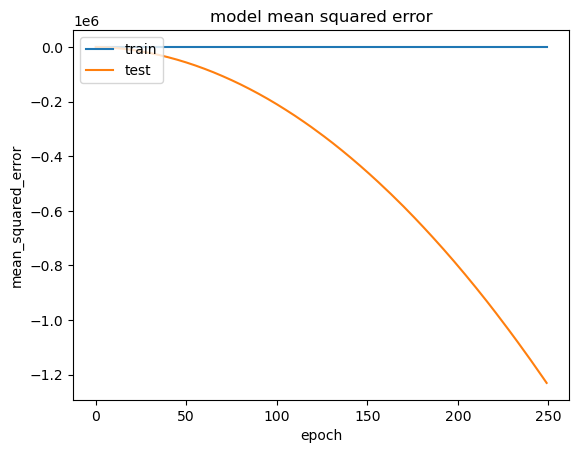

In [35]:
import matplotlib.pyplot as plt
plt.plot(history.history["mean_squared_error"])
plt.plot(history.history["val_loss"])
plt.title("model mean squared error")
plt.ylabel("mean_squared_error")
plt.xlabel("epoch")
plt.legend(["train","test"],loc="upper left")
plt.show()

*  We obtained the best possible and acceptable accuracy with the MLP regressor.

#Problem-2)

PREDICT THE BURNED AREA OF FOREST FIRES WITH NEURAL NETWORKS


#Solution:

In [36]:
forestfires=pd.read_csv('forestfires.csv')
forestfires

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,large
513,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,large
514,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,large
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small


##Basic & EDA

In [37]:
forestfires.shape

(517, 31)

In [38]:
forestfires.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 31 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   month          517 non-null    object 
 1   day            517 non-null    object 
 2   FFMC           517 non-null    float64
 3   DMC            517 non-null    float64
 4   DC             517 non-null    float64
 5   ISI            517 non-null    float64
 6   temp           517 non-null    float64
 7   RH             517 non-null    int64  
 8   wind           517 non-null    float64
 9   rain           517 non-null    float64
 10  area           517 non-null    float64
 11  dayfri         517 non-null    int64  
 12  daymon         517 non-null    int64  
 13  daysat         517 non-null    int64  
 14  daysun         517 non-null    int64  
 15  daythu         517 non-null    int64  
 16  daytue         517 non-null    int64  
 17  daywed         517 non-null    int64  
 18  monthapr  

* Datatypes of all features are correct.

In [39]:
forestfires.isna().sum()

month            0
day              0
FFMC             0
DMC              0
DC               0
ISI              0
temp             0
RH               0
wind             0
rain             0
area             0
dayfri           0
daymon           0
daysat           0
daysun           0
daythu           0
daytue           0
daywed           0
monthapr         0
monthaug         0
monthdec         0
monthfeb         0
monthjan         0
monthjul         0
monthjun         0
monthmar         0
monthmay         0
monthnov         0
monthoct         0
monthsep         0
size_category    0
dtype: int64

*  There are no null values in the given dataset. 

In [40]:
forestfires.duplicated().value_counts()

False    509
True       8
dtype: int64

*  There are 8 duplicate records in the given dataset. 

In [41]:
forestfires[forestfires.duplicated()]

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
53,aug,wed,92.1,111.2,654.1,9.6,20.4,42,4.9,0.0,...,0,0,0,0,0,0,0,0,0,small
100,aug,sun,91.4,142.4,601.4,10.6,19.8,39,5.4,0.0,...,0,0,0,0,0,0,0,0,0,small
215,mar,sat,91.7,35.8,80.8,7.8,17.0,27,4.9,0.0,...,0,0,0,0,1,0,0,0,0,large
303,jun,fri,91.1,94.1,232.1,7.1,19.2,38,4.5,0.0,...,0,0,0,1,0,0,0,0,0,small
426,aug,thu,91.6,248.4,753.8,6.3,20.4,56,2.2,0.0,...,0,0,0,0,0,0,0,0,0,small
461,aug,sat,93.7,231.1,715.1,8.4,18.9,64,4.9,0.0,...,0,0,0,0,0,0,0,0,0,small
501,aug,tue,96.1,181.1,671.2,14.3,21.6,65,4.9,0.8,...,0,0,0,0,0,0,0,0,0,small
508,aug,fri,91.0,166.9,752.6,7.1,25.9,41,3.6,0.0,...,0,0,0,0,0,0,0,0,0,small


In [42]:
#Droping duplicated records from dataset
ffires_nodup=forestfires.copy()
ffires_nodup=forestfires.drop_duplicates().reset_index()
ffires_nodup=ffires_nodup.drop('index',axis=1)
ffires_nodup

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,large
505,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,large
506,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,large
507,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small


In [43]:
ffires_nodup.describe().T

,count,mean,std,min,25%,50%,75%,max
FFMC,509.0,90.618075,5.555527,18.7,90.2,91.60,92.90,96.20
DMC,509.0,110.235756,63.804112,1.1,62.3,108.30,141.30,291.30
DC,509.0,547.787623,248.196222,7.9,437.7,664.20,713.90,860.60
ISI,509.0,9.023576,4.585083,0.0,6.4,8.40,11.00,56.10
temp,509.0,18.865422,5.841083,2.2,15.4,19.30,22.80,33.30
RH,509.0,44.253438,16.365192,15.0,32.0,42.00,53.00,100.00
wind,509.0,4.011395,1.800926,0.4,2.7,4.00,4.90,9.40
rain,509.0,0.020432,0.296261,0.0,0.0,0.00,0.00,6.40
area,509.0,12.992908,64.133357,0.0,0.0,0.61,6.58,1090.84
dayfri,509.0,0.163065,0.369788,0.0,0.0,0.00,0.00,1.00


In [44]:
# number of distinct values in each feature
for i, column in enumerate(ffires_nodup.columns, 1):
  print('Distinct values in feature ',ffires_nodup[column].name,' are ',ffires_nodup[column].nunique())

Distinct values in feature  month  are  12
Distinct values in feature  day  are  7
Distinct values in feature  FFMC  are  106
Distinct values in feature  DMC  are  215
Distinct values in feature  DC  are  219
Distinct values in feature  ISI  are  119
Distinct values in feature  temp  are  192
Distinct values in feature  RH  are  75
Distinct values in feature  wind  are  21
Distinct values in feature  rain  are  7
Distinct values in feature  area  are  251
Distinct values in feature  dayfri  are  2
Distinct values in feature  daymon  are  2
Distinct values in feature  daysat  are  2
Distinct values in feature  daysun  are  2
Distinct values in feature  daythu  are  2
Distinct values in feature  daytue  are  2
Distinct values in feature  daywed  are  2
Distinct values in feature  monthapr  are  2
Distinct values in feature  monthaug  are  2
Distinct values in feature  monthdec  are  2
Distinct values in feature  monthfeb  are  2
Distinct values in feature  monthjan  are  2
Distinct value

##Visualizing data points

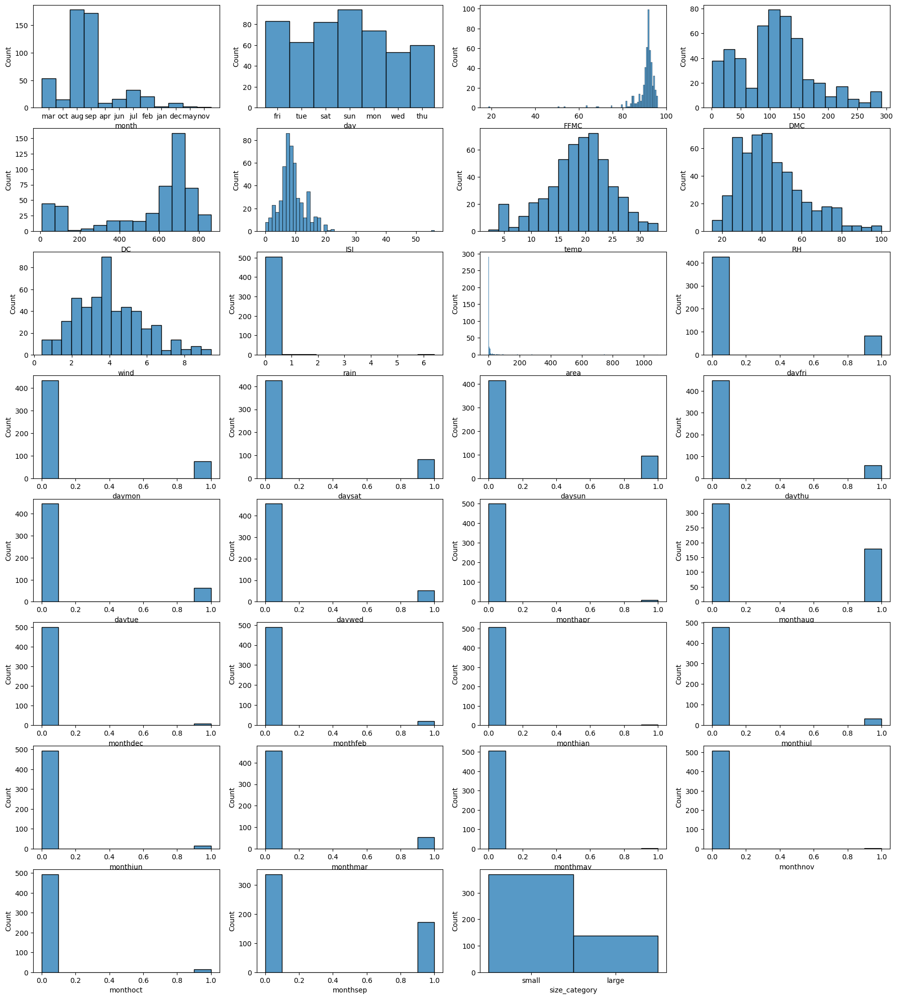

In [45]:
#plotting histplots to observe datapoints nature
plt.figure(figsize=(22,25))
for i, column in enumerate(ffires_nodup.columns, 1):
    plt.subplot(8,4,i)
    sns.histplot(ffires_nodup[column])

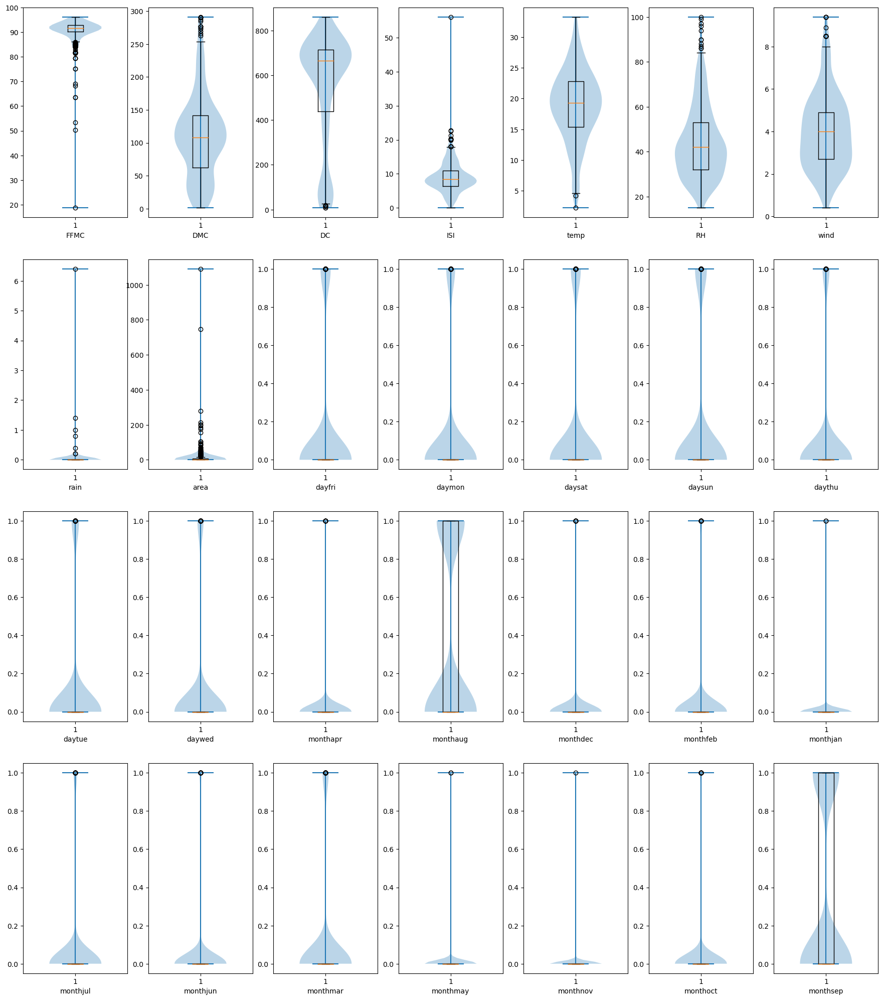

In [46]:
#plotting boxplots to observe datapoints nature
plt.figure(figsize=(22,25))
for i, column in enumerate(ffires_nodup[[feature for feature in ffires_nodup.columns if ffires_nodup[feature].dtypes != 'O']].columns, 1):
    plt.subplot(4,7,i)
    plt.violinplot(ffires_nodup[column])
    plt.boxplot(ffires_nodup[column])
    plt.xlabel(ffires_nodup[column].name)

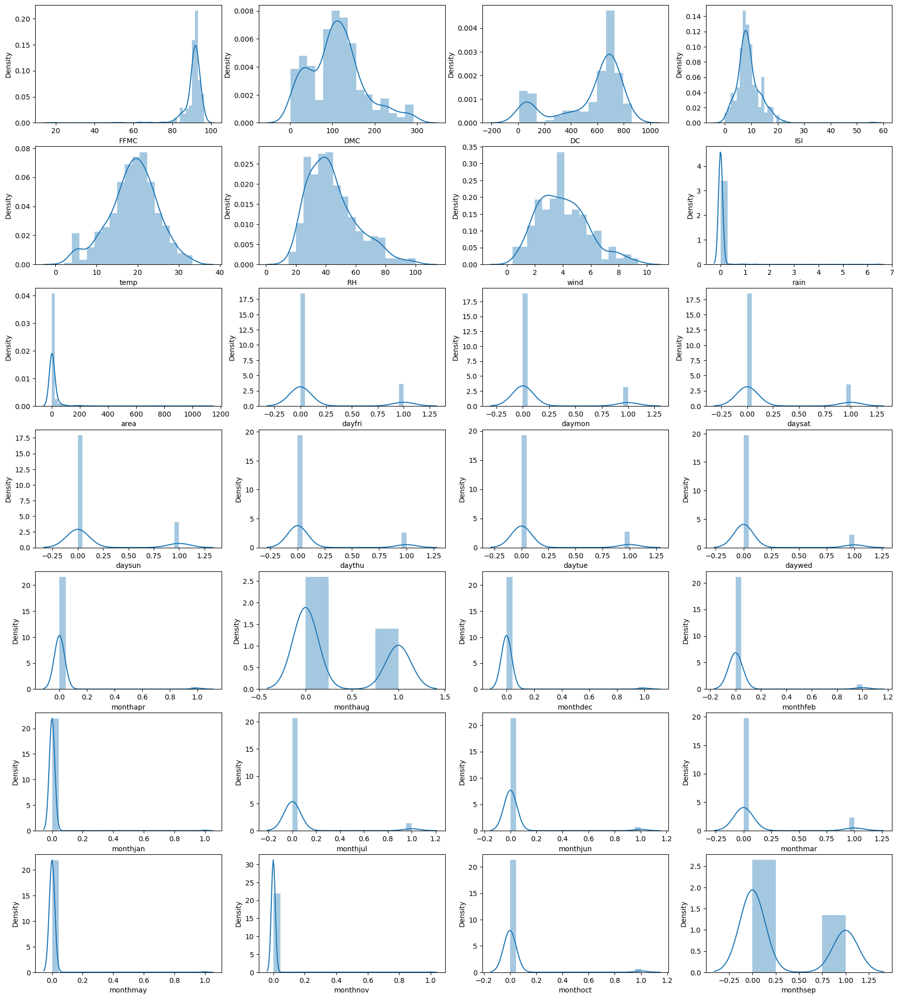

In [47]:
#plotting histplots to observe datapoints nature
plt.figure(figsize=(22,25))
for i, column in enumerate(ffires_nodup[[feature for feature in ffires_nodup.columns if ffires_nodup[feature].dtypes != 'O']].columns, 1):
    plt.subplot(7,4,i)
    sns.distplot(ffires_nodup[column])

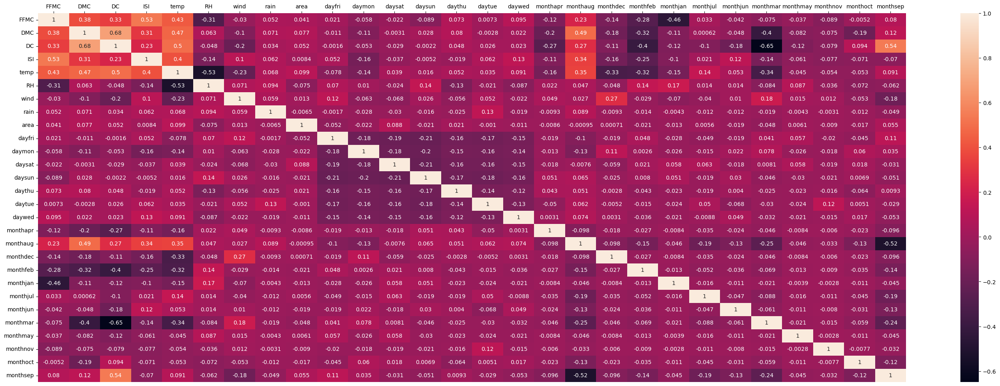

In [48]:
#plotting the heatmap for correlation
plt.figure(figsize=(35,12))
ax = sns.heatmap(ffires_nodup.corr(), annot=True)
ax.xaxis.tick_top()

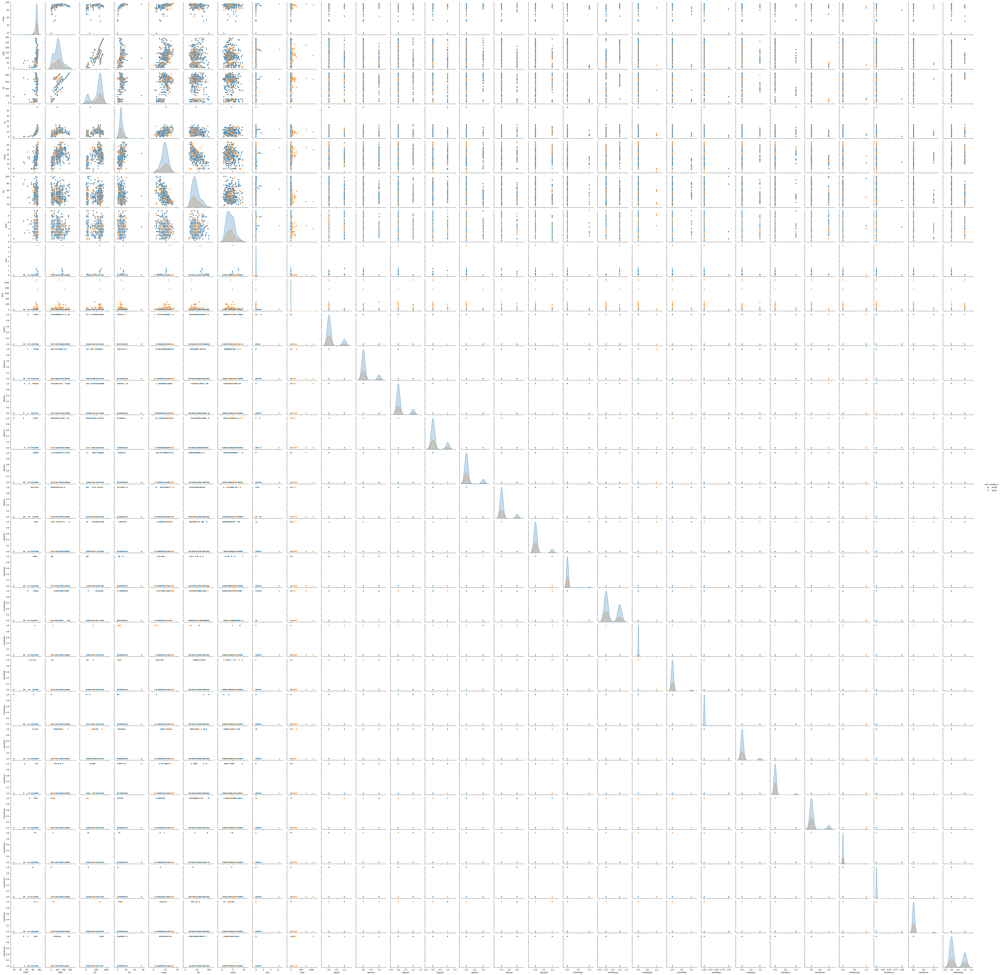

In [49]:
#pairplot
sns.pairplot(ffires_nodup,hue='size_category')

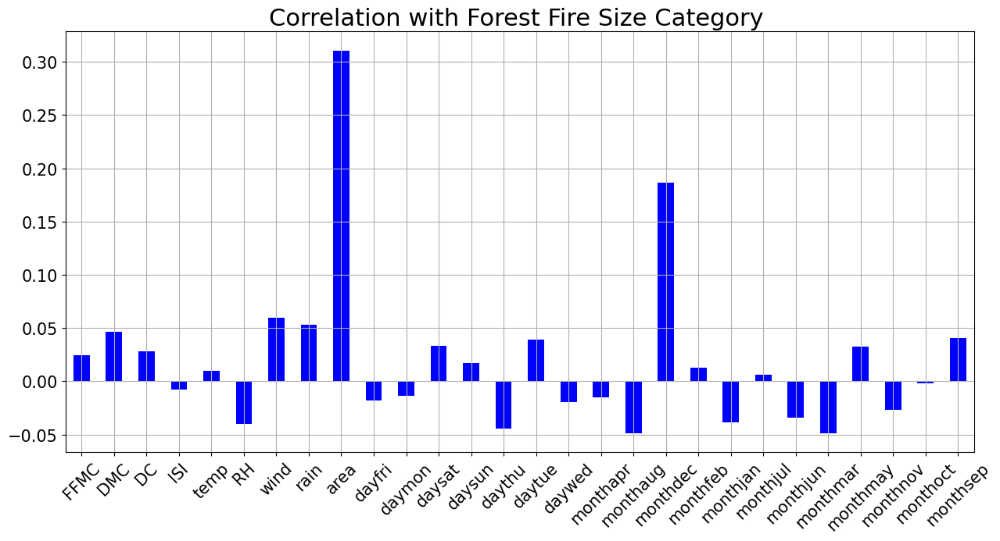

In [50]:
#Correlation with Forest Fire Size Category
df = ffires_nodup.copy()
df['size_category'] = np.where(df['size_category'].str.contains("large"), 1, 0)

correlations = ffires_nodup.corrwith(df.size_category)
correlations = correlations[correlations!=1]
positive_correlations = correlations[correlations >0].sort_values(ascending = False)
negative_correlations =correlations[correlations<0].sort_values(ascending = False)

correlations.plot.bar(figsize= (15,7), fontsize = 15, color = 'blue', rot = 45, grid = True)
plt.title('Correlation with Forest Fire Size Category ', horizontalalignment="center", fontsize = "22");

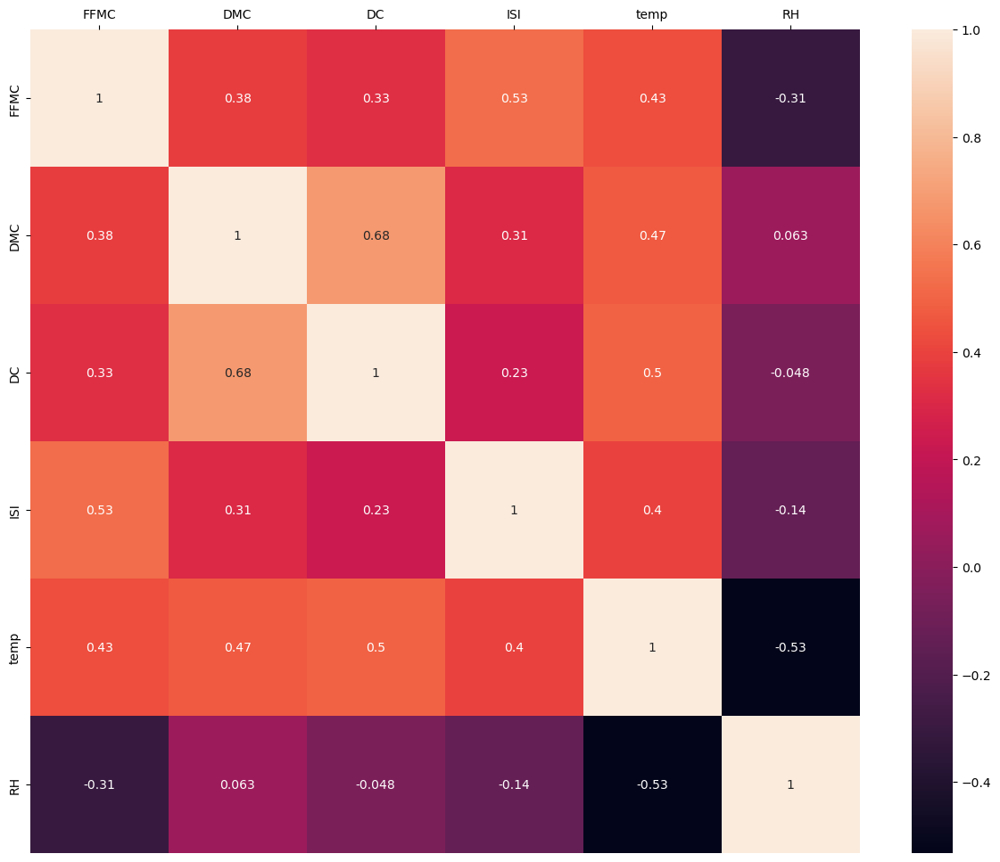

In [51]:
#plotting the heatmap for correlation(standard features)
plt.figure(figsize=(15,12))
ax = sns.heatmap(ffires_nodup.iloc[:,:8].corr(), annot=True)
ax.xaxis.tick_top()

##Label encoding

In [52]:
from sklearn import preprocessing
ffires_lab=ffires_nodup.copy()
for i, column in enumerate(ffires_lab[[feature for feature in ffires_lab.columns if ffires_lab[feature].dtypes == 'O']].columns, 1):
  label_encoder=preprocessing.LabelEncoder()
  ffires_lab[column]=label_encoder.fit_transform(ffires_lab[column])
ffires_lab

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,7,0,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,1
1,10,5,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,1
2,10,2,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,1
3,7,0,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,1
4,7,3,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,1,3,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,0
505,1,3,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,0
506,1,3,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,0
507,1,2,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,1


##Standardising Data

In [53]:
std=StandardScaler()
ffires_std=ffires_lab.copy()
std.fit_transform(ffires_std)

array([[ 2.71858196e-01, -1.42449474e+00, -7.96039810e-01, ...,
        -1.74253759e-01, -7.14412875e-01,  6.09891511e-01],
       [ 9.58019296e-01,  1.17804590e+00, -3.25665522e-03, ...,
         5.73875712e+00, -7.14412875e-01,  6.09891511e-01],
       [ 9.58019296e-01, -3.83478484e-01, -3.25665522e-03, ...,
         5.73875712e+00, -7.14412875e-01,  6.09891511e-01],
       ...,
       [-1.10046400e+00,  1.37029645e-01, -1.62485856e+00, ...,
        -1.74253759e-01, -7.14412875e-01, -1.63963587e+00],
       [-1.10046400e+00, -3.83478484e-01,  6.81419706e-01, ...,
        -1.74253759e-01, -7.14412875e-01,  6.09891511e-01],
       [ 7.29298930e-01,  1.17804590e+00, -2.00323234e+00, ...,
        -1.74253759e-01, -7.14412875e-01,  6.09891511e-01]])

In [54]:
ffires_std=pd.DataFrame(std.fit_transform(ffires_std),columns=ffires_lab.columns)
ffires_std

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,0.271858,-1.424495,-0.796040,-1.318386,-1.828931,-0.856568,-1.827729,0.412656,1.494370,-0.069035,...,-0.202237,-0.062807,-0.25901,-0.180151,2.933219,-0.062807,-0.044368,-0.174254,-0.714413,0.609892
1,0.958019,1.178046,-0.003257,-1.174053,0.489257,-0.507267,-0.148307,-0.688321,-1.729364,-0.069035,...,-0.202237,-0.062807,-0.25901,-0.180151,-0.340922,-0.062807,-0.044368,5.738757,-0.714413,0.609892
2,0.958019,-0.383478,-0.003257,-1.043839,0.561045,-0.507267,-0.730964,-0.688321,-1.507037,-0.069035,...,-0.202237,-0.062807,-0.25901,-0.180151,-0.340922,-0.062807,-0.044368,5.738757,-0.714413,0.609892
3,0.271858,-1.424495,0.194939,-1.206998,-1.896686,-0.005147,-1.810592,3.226265,-0.006333,0.606709,...,-0.202237,-0.062807,-0.25901,-0.180151,2.933219,-0.062807,-0.044368,-0.174254,-0.714413,0.609892
4,0.271858,0.137030,-0.237488,-0.924607,-1.797070,0.125841,-1.279346,3.348596,-1.229129,-0.069035,...,-0.202237,-0.062807,-0.25901,-0.180151,2.933219,-0.062807,-0.044368,-0.174254,-0.714413,0.609892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,-1.100464,0.137030,-1.624859,-0.839890,0.475141,-1.555170,1.531115,-0.749487,-0.728894,-0.069035,...,-0.202237,-0.062807,-0.25901,-0.180151,-0.340922,-0.062807,-0.044368,-0.174254,-0.714413,-1.639636
505,-1.100464,0.137030,-1.624859,-0.839890,0.475141,-1.555170,0.520034,1.635965,0.994136,-0.069035,...,-0.202237,-0.062807,-0.25901,-0.180151,-0.340922,-0.062807,-0.044368,-0.174254,-0.714413,-1.639636
506,-1.100464,0.137030,-1.624859,-0.839890,0.475141,-1.555170,0.400076,1.574799,1.494370,-0.069035,...,-0.202237,-0.062807,-0.25901,-0.180151,-0.340922,-0.062807,-0.044368,-0.174254,-0.714413,-1.639636
507,-1.100464,-0.383478,0.681420,0.561083,0.269860,0.496973,1.154102,-0.137832,-0.006333,-0.069035,...,-0.202237,-0.062807,-0.25901,-0.180151,-0.340922,-0.062807,-0.044368,-0.174254,-0.714413,0.609892


## Data Splitting

In [55]:
x=ffires_std.drop('size_category',axis=1)
y=ffires_std['size_category']

In [56]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)
x_train.shape, x_test.shape,y_train.shape, y_test.shape

((341, 30), (168, 30), (341,), (168,))

## **Tuning of Hyperparameters :-** 

1.   Batch Size
2.   Epochs

In [58]:
# libs
import tensorflow
from sklearn.model_selection import GridSearchCV,KFold
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
#optimizers
from keras.optimizers import adam
from tensorflow.keras.optimizers import Adam

In [59]:
#model def creation
def create_model():
    model = Sequential(name='Hypterparameter-Tuning-Dummy')
    model.add(Dense(12, input_dim=30, kernel_initializer='uniform', activation='relu'))
    model.add(Dense(8,kernel_initializer='uniform', activation='relu'))
    model.add(Dense(1, kernel_initializer='uniform', activation='sigmoid'))
    
    adam=Adam(learning_rate=0.01)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    return model

In [60]:
#model
model=KerasClassifier(build_fn=create_model,verbose=0)
#hyper param 
batch_size=[10,20]
epochs=[10,20,50]
# Make a dictionary of the grid search parameters
param_grid = dict(batch_size = batch_size,epochs = epochs)
# Build and fit the GridSearchCV
grid = GridSearchCV(estimator = model,param_grid = param_grid,cv = KFold(),verbose = 10)
grid_result = grid.fit(x,y)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5; 1/6] START batch_size=10, epochs=10....................................
[CV 1/5; 1/6] END .....batch_size=10, epochs=10;, score=0.941 total time=   1.8s
[CV 2/5; 1/6] START batch_size=10, epochs=10....................................
[CV 2/5; 1/6] END .....batch_size=10, epochs=10;, score=0.804 total time=   1.6s
[CV 3/5; 1/6] START batch_size=10, epochs=10....................................
[CV 3/5; 1/6] END .....batch_size=10, epochs=10;, score=0.853 total time=   1.3s
[CV 4/5; 1/6] START batch_size=10, epochs=10....................................
[CV 4/5; 1/6] END .....batch_size=10, epochs=10;, score=0.814 total time=   1.6s
[CV 5/5; 1/6] START batch_size=10, epochs=10....................................
[CV 5/5; 1/6] END .....batch_size=10, epochs=10;, score=0.832 total time=   1.7s
[CV 1/5; 2/6] START batch_size=10, epochs=20....................................
[CV 1/5; 2/6] END .....batch_size=10, epochs=20;,

In [61]:
#summarizing results
print('Best:{},using{}'.format(grid_result.best_score_,grid_result.best_params_))
means=grid_result.cv_results_['mean_test_score']
stds=grid_result.cv_results_['std_test_score']
params=grid_result.cv_results_['params']
for mean,stdev,param in zip(means,stds,params):
  print('{},{} with:{}'.format(mean,stdev,param))

Best:0.9076295852661133,using{'batch_size': 10, 'epochs': 50}
0.8486895680427551,0.04916865365587995 with:{'batch_size': 10, 'epochs': 10}
0.8918850660324097,0.04038621033308344 with:{'batch_size': 10, 'epochs': 20}
0.9076295852661133,0.05675412135397232 with:{'batch_size': 10, 'epochs': 50}
0.8546107530593872,0.07528965662903568 with:{'batch_size': 20, 'epochs': 10}
0.8919238924980164,0.05480539990778651 with:{'batch_size': 20, 'epochs': 20}
0.8958454489707947,0.059722543346223685 with:{'batch_size': 20, 'epochs': 50}


## Tuning of Hyperparameters:- Learning rate and Drop out rate

In [62]:
from keras.layers import Dropout
#model def
def create_model(learning_rate,dropout_rate):
  model=Sequential()
  model.add(Dense(8,input_dim=30,kernel_initializer='normal',activation='relu'))
  model.add(Dropout(dropout_rate))
  model.add(Dense(12,input_dim=8,kernel_initializer='normal',activation='relu'))
  model.add(Dropout(dropout_rate))
  model.add(Dense(1,activation='sigmoid'))

  adam=Adam(learning_rate=learning_rate)
  model.compile(loss='binary_crossentropy',optimizer=adam,metrics=['accuracy'])
  return model

#model creation
model=KerasClassifier(build_fn=create_model,verbose=0,batch_size=40,epochs=50)
#grid search params
learning_rate=[0.001,0.01,0.1]
dropout_rate=[0.0,0.1,0.2]
#grid search dictionary
param_grids=dict(learning_rate=learning_rate,dropout_rate=dropout_rate)

#gridsearch cv fit
grid=GridSearchCV(estimator=model,param_grid=param_grids,cv=KFold(),verbose=10)
grid_result=grid.fit(x,y)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5; 1/9] START dropout_rate=0.0, learning_rate=0.001.......................
[CV 1/5; 1/9] END dropout_rate=0.0, learning_rate=0.001;, score=1.000 total time=   2.1s
[CV 2/5; 1/9] START dropout_rate=0.0, learning_rate=0.001.......................
[CV 2/5; 1/9] END dropout_rate=0.0, learning_rate=0.001;, score=0.765 total time=   2.2s
[CV 3/5; 1/9] START dropout_rate=0.0, learning_rate=0.001.......................
[CV 3/5; 1/9] END dropout_rate=0.0, learning_rate=0.001;, score=0.657 total time=   2.2s
[CV 4/5; 1/9] START dropout_rate=0.0, learning_rate=0.001.......................
[CV 4/5; 1/9] END dropout_rate=0.0, learning_rate=0.001;, score=0.775 total time=   2.2s
[CV 5/5; 1/9] START dropout_rate=0.0, learning_rate=0.001.......................
[CV 5/5; 1/9] END dropout_rate=0.0, learning_rate=0.001;, score=0.743 total time=   2.8s
[CV 1/5; 2/9] START dropout_rate=0.0, learning_rate=0.01........................
[CV 1/5; 

[CV 1/5; 9/9] END dropout_rate=0.2, learning_rate=0.1;, score=1.000 total time=   2.3s
[CV 2/5; 9/9] START dropout_rate=0.2, learning_rate=0.1.........................
[CV 2/5; 9/9] END dropout_rate=0.2, learning_rate=0.1;, score=0.775 total time=   2.5s
[CV 3/5; 9/9] START dropout_rate=0.2, learning_rate=0.1.........................
[CV 3/5; 9/9] END dropout_rate=0.2, learning_rate=0.1;, score=0.510 total time=   2.0s
[CV 4/5; 9/9] START dropout_rate=0.2, learning_rate=0.1.........................
[CV 4/5; 9/9] END dropout_rate=0.2, learning_rate=0.1;, score=0.833 total time=   2.5s
[CV 5/5; 9/9] START dropout_rate=0.2, learning_rate=0.1.........................
[CV 5/5; 9/9] END dropout_rate=0.2, learning_rate=0.1;, score=0.851 total time=   2.4s


In [63]:
#summarizing results
print('Best:{},using{}'.format(grid_result.best_score_,grid_result.best_params_))
means=grid_result.cv_results_['mean_test_score']
stds=grid_result.cv_results_['std_test_score']
params=grid_result.cv_results_['params']
for mean,stdev,param in zip(means,stds,params):
  print('{},{} with:{}'.format(mean,stdev,param))

Best:0.9174917459487915,using{'dropout_rate': 0.0, 'learning_rate': 0.01}
0.7877305388450623,0.11395500573268985 with:{'dropout_rate': 0.0, 'learning_rate': 0.001}
0.9174917459487915,0.0458047064480121 with:{'dropout_rate': 0.0, 'learning_rate': 0.01}
0.8978062391281127,0.04754476600267732 with:{'dropout_rate': 0.0, 'learning_rate': 0.1}
0.7779460430145264,0.10671757213273449 with:{'dropout_rate': 0.1, 'learning_rate': 0.001}
0.9077072381973267,0.054209780662396276 with:{'dropout_rate': 0.1, 'learning_rate': 0.01}
0.8310813426971435,0.08922798531668268 with:{'dropout_rate': 0.1, 'learning_rate': 0.1}
0.7779072046279907,0.11988152989891988 with:{'dropout_rate': 0.2, 'learning_rate': 0.001}
0.9076295733451843,0.04753801069028415 with:{'dropout_rate': 0.2, 'learning_rate': 0.01}
0.7938264369964599,0.16027149605138608 with:{'dropout_rate': 0.2, 'learning_rate': 0.1}


## Tuning of Hyperparameters:- Activation Function and Kernel Initializer

In [64]:
#model def
def create_model(activation_function,init):
  model=Sequential()
  model.add(Dense(8,input_dim=30,kernel_initializer=init,activation=activation_function))
  model.add(Dropout(0.2))
  model.add(Dense(12,input_dim=8,kernel_initializer=init,activation=activation_function))
  model.add(Dropout(0.2))
  model.add(Dense(1,activation='sigmoid'))

  adam=Adam(learning_rate=0.001)
  model.compile(loss='binary_crossentropy',optimizer=adam,metrics=['accuracy'])
  return model

#model creation
model=KerasClassifier(build_fn=create_model,verbose=0,batch_size=40,epochs=50)
#grid search params
activation_function=['softmax','relu','tanh','linear']
init=['uniform','normal','zero']
#grid search dictionary
param_grids=dict(activation_function=activation_function,init=init)

#gridsearch cv fit
grid=GridSearchCV(estimator=model,param_grid=param_grids,cv=KFold(),verbose=10)
grid_result=grid.fit(x,y)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START activation_function=softmax, init=uniform..................
[CV 1/5; 1/12] END activation_function=softmax, init=uniform;, score=1.000 total time=   1.7s
[CV 2/5; 1/12] START activation_function=softmax, init=uniform..................
[CV 2/5; 1/12] END activation_function=softmax, init=uniform;, score=0.765 total time=   2.2s
[CV 3/5; 1/12] START activation_function=softmax, init=uniform..................
[CV 3/5; 1/12] END activation_function=softmax, init=uniform;, score=0.510 total time=   3.4s
[CV 4/5; 1/12] START activation_function=softmax, init=uniform..................
[CV 4/5; 1/12] END activation_function=softmax, init=uniform;, score=0.676 total time=   2.3s
[CV 5/5; 1/12] START activation_function=softmax, init=uniform..................
[CV 5/5; 1/12] END activation_function=softmax, init=uniform;, score=0.693 total time=   2.0s
[CV 1/5; 2/12] START activation_function=softmax, init=normal...

[CV 3/5; 10/12] END activation_function=linear, init=uniform;, score=0.814 total time=   1.9s
[CV 4/5; 10/12] START activation_function=linear, init=uniform..................
[CV 4/5; 10/12] END activation_function=linear, init=uniform;, score=0.833 total time=   2.2s
[CV 5/5; 10/12] START activation_function=linear, init=uniform..................
[CV 5/5; 10/12] END activation_function=linear, init=uniform;, score=0.861 total time=   2.2s
[CV 1/5; 11/12] START activation_function=linear, init=normal...................
[CV 1/5; 11/12] END activation_function=linear, init=normal;, score=0.990 total time=   2.2s
[CV 2/5; 11/12] START activation_function=linear, init=normal...................
[CV 2/5; 11/12] END activation_function=linear, init=normal;, score=0.765 total time=   2.2s
[CV 3/5; 11/12] START activation_function=linear, init=normal...................
[CV 3/5; 11/12] END activation_function=linear, init=normal;, score=0.784 total time=   2.2s
[CV 4/5; 11/12] START activation_f

In [65]:
# Summarizin results
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
  print('{},{} with: {}'.format(mean, stdev, param))

Best : 0.8663948535919189, using {'activation_function': 'tanh', 'init': 'uniform'}
0.728809940814972,0.1592563941055272 with: {'activation_function': 'softmax', 'init': 'uniform'}
0.728809940814972,0.1592563941055272 with: {'activation_function': 'softmax', 'init': 'normal'}
0.728809940814972,0.1592563941055272 with: {'activation_function': 'softmax', 'init': 'zero'}
0.7505338907241821,0.15674923969689156 with: {'activation_function': 'relu', 'init': 'uniform'}
0.7858279943466187,0.09719122287338491 with: {'activation_function': 'relu', 'init': 'normal'}
0.728809940814972,0.1592563941055272 with: {'activation_function': 'relu', 'init': 'zero'}
0.8663948535919189,0.0683926280545317 with: {'activation_function': 'tanh', 'init': 'uniform'}
0.8506309390068054,0.0754103621793289 with: {'activation_function': 'tanh', 'init': 'normal'}
0.728809940814972,0.1592563941055272 with: {'activation_function': 'tanh', 'init': 'zero'}
0.8605125069618225,0.06774784506796032 with: {'activation_function'

## Tuning of Hyperparameter :-Number of Neurons in activation layer

In [66]:
#model def
def create_model(neuron1,neuron2):
  model=Sequential()
  model.add(Dense(neuron1,input_dim=30,kernel_initializer='uniform',activation='linear'))
  model.add(Dropout(0.2))
  model.add(Dense(neuron2,input_dim=neuron1,kernel_initializer='uniform',activation='linear'))
  model.add(Dropout(0.2))
  model.add(Dense(1,activation='sigmoid'))

  adam=Adam(learning_rate=0.001)
  model.compile(loss='binary_crossentropy',optimizer=adam,metrics=['accuracy'])
  return model

#model creation
model=KerasClassifier(build_fn=create_model,verbose=0,batch_size=40,epochs=50)
#grid search params
neuron1=[4,8,16]
neuron2=[2,4,8]
#grid search dictionary
param_grids=dict(neuron1=neuron1,neuron2=neuron2)

#gridsearch cv fit
grid=GridSearchCV(estimator=model,param_grid=param_grids,cv=KFold(),verbose=10)
grid_result=grid.fit(x,y)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5; 1/9] START neuron1=4, neuron2=2........................................
[CV 1/5; 1/9] END .........neuron1=4, neuron2=2;, score=0.971 total time=   2.2s
[CV 2/5; 1/9] START neuron1=4, neuron2=2........................................
[CV 2/5; 1/9] END .........neuron1=4, neuron2=2;, score=0.765 total time=   2.0s
[CV 3/5; 1/9] START neuron1=4, neuron2=2........................................
[CV 3/5; 1/9] END .........neuron1=4, neuron2=2;, score=0.676 total time=   2.0s
[CV 4/5; 1/9] START neuron1=4, neuron2=2........................................
[CV 4/5; 1/9] END .........neuron1=4, neuron2=2;, score=0.716 total time=   1.4s
[CV 5/5; 1/9] START neuron1=4, neuron2=2........................................
[CV 5/5; 1/9] END .........neuron1=4, neuron2=2;, score=0.723 total time=   1.5s
[CV 1/5; 2/9] START neuron1=4, neuron2=4........................................
[CV 1/5; 2/9] END .........neuron1=4, neuron2=4;,

In [67]:
# Summarizing the results
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
  print('{},{} with: {}'.format(mean, stdev, param))

Best : 0.8722966194152832, using {'neuron1': 16, 'neuron2': 8}
0.7700446486473084,0.10410748011687054 with: {'neuron1': 4, 'neuron2': 2}
0.7995923161506653,0.09935237348318884 with: {'neuron1': 4, 'neuron2': 4}
0.8112793684005737,0.09173035844556798 with: {'neuron1': 4, 'neuron2': 8}
0.7976315259933472,0.10011534983919748 with: {'neuron1': 8, 'neuron2': 2}
0.8173170208930969,0.09287205904095512 with: {'neuron1': 8, 'neuron2': 4}
0.8487478137016297,0.07729907173629542 with: {'neuron1': 8, 'neuron2': 8}
0.8428266286849976,0.07769506911600063 with: {'neuron1': 16, 'neuron2': 2}
0.8526499629020691,0.07310565157675358 with: {'neuron1': 16, 'neuron2': 4}
0.8722966194152832,0.06443992100052999 with: {'neuron1': 16, 'neuron2': 8}


## Training model with optimum values of Hyperparameters

In [68]:
# Python program to define a function to compute accuracy score of model's predicted class  
  
# Defining a function which takes true values of the sample and values predicted by the model  
def compute_accuracy(Y_true, Y_pred):  
    correctly_predicted = 0  
    # iterating over every label and checking it with the true sample  
    for true_label, predicted in zip(Y_true, Y_pred):  
        if true_label == predicted:  
            correctly_predicted += 1  
    # computing the accuracy score  
    accuracy_score = correctly_predicted / len(Y_true)  
    return accuracy_score  

In [69]:
from sklearn.metrics import classification_report, accuracy_score
#model def
def create_model():
  model=Sequential()
  model.add(Dense(16,input_dim=30,kernel_initializer='uniform',activation='linear'))
  model.add(Dropout(0.2))
  model.add(Dense(4,input_dim=16,kernel_initializer='uniform',activation='linear'))
  model.add(Dropout(0.2))
  model.add(Dense(1,activation='sigmoid'))

  adam=Adam(learning_rate=0.01)
  model.compile(loss='binary_crossentropy',optimizer=adam,metrics=['accuracy'])
  return model

#model creation
model=KerasClassifier(build_fn=create_model,verbose=0,batch_size=20,epochs=50)
#model fit
model.fit(x,y)
#prediction on train 
y_pred=model.predict(x)
#printing mertics
compute_accuracy(y,y_pred)

16/16 [==============================] - 0s 2ms/step


0.9842829076620825

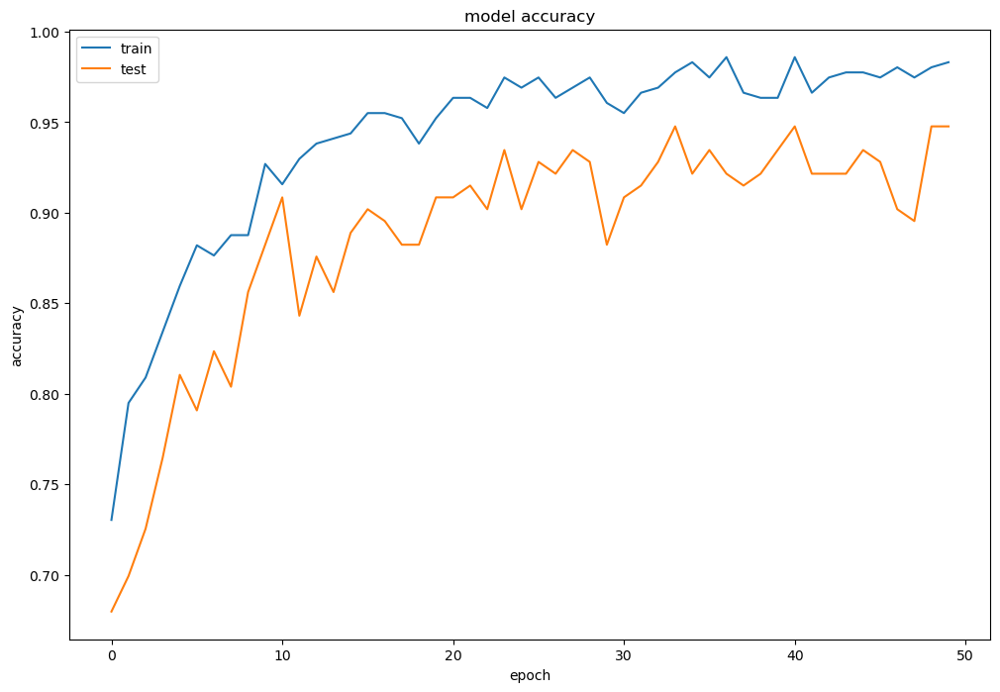

In [70]:
#final plot with accuracy of train and test
history = model.fit(x,y,validation_split = 0.3, epochs=50, batch_size=20)
plt.figure(figsize=(12,8))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## MLPRegressor

In [71]:
from sklearn.neural_network import MLPRegressor
mlp = MLPRegressor(hidden_layer_sizes=(30,30))
mlp.fit(x_train,y_train)
pred_train=mlp.predict(x_train)
pred_test=mlp.predict(x_test)

In [72]:
from sklearn.metrics import r2_score, mean_squared_error
rs1=r2_score(y_train,pred_train)
mse1=mean_squared_error(y_train,pred_train)
rs1,mse1

(0.7884630284681391, 0.2108857660601012)

In [73]:
rs2=r2_score(y_test,pred_test)
mse2=mean_squared_error(y_train,pred_train)
rs2,mse2

(0.2934933152160344, 0.2108857660601012)

In [74]:
!pip install keras 
!pip install tensorflow
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential

In [75]:
model=Sequential()
model.add(Dense(15,input_dim=30,activation="relu"))
model.add(Dense(1,activation="sigmoid"))
model.compile(loss="binary_crossentropy",optimizer="adam",metrics=["mean_squared_error"])

In [76]:
history=model.fit(x,y,validation_split=0.33,epochs=250,batch_size=10)
scores=model.evaluate(x,y)
print("%s: %.2f%%"%(model.metrics_names[1],scores[1]*100))
history.history.keys()

Epoch 1/250
35/35 [==============================] - 1s 7ms/step - loss: 0.7948 - mean_squared_error: 1.1647 - val_loss: 0.4226 - val_mean_squared_error: 1.4047
Epoch 2/250
35/35 [==============================] - 0s 7ms/step - loss: 0.6113 - mean_squared_error: 1.0865 - val_loss: 0.3239 - val_mean_squared_error: 1.3612
Epoch 3/250
35/35 [==============================] - 0s 6ms/step - loss: 0.4996 - mean_squared_error: 1.0375 - val_loss: 0.2491 - val_mean_squared_error: 1.3284
Epoch 4/250
35/35 [==============================] - 0s 7ms/step - loss: 0.4146 - mean_squared_error: 1.0040 - val_loss: 0.1917 - val_mean_squared_error: 1.3028
Epoch 5/250
35/35 [==============================] - 0s 6ms/step - loss: 0.3367 - mean_squared_error: 0.9749 - val_loss: 0.1384 - val_mean_squared_error: 1.2837
Epoch 6/250
35/35 [==============================] - 0s 6ms/step - loss: 0.2673 - mean_squared_error: 0.9541 - val_loss: 0.0701 - val_mean_squared_error: 1.2621
Epoch 7/250
35/35 [===============

35/35 [==============================] - 0s 5ms/step - loss: -3.8963 - mean_squared_error: 0.8624 - val_loss: -3.3065 - val_mean_squared_error: 1.1865
Epoch 52/250
35/35 [==============================] - 0s 5ms/step - loss: -4.0582 - mean_squared_error: 0.8607 - val_loss: -3.4048 - val_mean_squared_error: 1.1830
Epoch 53/250
35/35 [==============================] - 0s 5ms/step - loss: -4.2228 - mean_squared_error: 0.8618 - val_loss: -3.5646 - val_mean_squared_error: 1.1839
Epoch 54/250
35/35 [==============================] - 0s 5ms/step - loss: -4.4111 - mean_squared_error: 0.8622 - val_loss: -3.7533 - val_mean_squared_error: 1.1864
Epoch 55/250
35/35 [==============================] - 0s 4ms/step - loss: -4.5866 - mean_squared_error: 0.8627 - val_loss: -3.8837 - val_mean_squared_error: 1.1844
Epoch 56/250
35/35 [==============================] - 0s 5ms/step - loss: -4.7587 - mean_squared_error: 0.8625 - val_loss: -4.0029 - val_mean_squared_error: 1.1804
Epoch 57/250
35/35 [=========

Epoch 101/250
35/35 [==============================] - 0s 4ms/step - loss: -16.7747 - mean_squared_error: 0.8615 - val_loss: -13.2626 - val_mean_squared_error: 1.1562
Epoch 102/250
35/35 [==============================] - 0s 5ms/step - loss: -17.1035 - mean_squared_error: 0.8614 - val_loss: -13.5664 - val_mean_squared_error: 1.1582
Epoch 103/250
35/35 [==============================] - 0s 4ms/step - loss: -17.4268 - mean_squared_error: 0.8664 - val_loss: -13.7894 - val_mean_squared_error: 1.1549
Epoch 104/250
35/35 [==============================] - 0s 5ms/step - loss: -17.7769 - mean_squared_error: 0.8674 - val_loss: -14.0547 - val_mean_squared_error: 1.1577
Epoch 105/250
35/35 [==============================] - 0s 5ms/step - loss: -18.1153 - mean_squared_error: 0.8648 - val_loss: -14.3317 - val_mean_squared_error: 1.1591
Epoch 106/250
35/35 [==============================] - 0s 5ms/step - loss: -18.4557 - mean_squared_error: 0.8642 - val_loss: -14.5497 - val_mean_squared_error: 1.156

35/35 [==============================] - 0s 3ms/step - loss: -36.5911 - mean_squared_error: 0.8733 - val_loss: -28.9226 - val_mean_squared_error: 1.1603
Epoch 151/250
35/35 [==============================] - 0s 4ms/step - loss: -37.0559 - mean_squared_error: 0.8736 - val_loss: -29.4629 - val_mean_squared_error: 1.1611
Epoch 152/250
35/35 [==============================] - 0s 4ms/step - loss: -37.5084 - mean_squared_error: 0.8721 - val_loss: -29.7661 - val_mean_squared_error: 1.1602
Epoch 153/250
35/35 [==============================] - 0s 4ms/step - loss: -37.9318 - mean_squared_error: 0.8740 - val_loss: -30.2416 - val_mean_squared_error: 1.1614
Epoch 154/250
35/35 [==============================] - 0s 5ms/step - loss: -38.4684 - mean_squared_error: 0.8739 - val_loss: -30.4554 - val_mean_squared_error: 1.1597
Epoch 155/250
35/35 [==============================] - 0s 5ms/step - loss: -38.9476 - mean_squared_error: 0.8727 - val_loss: -30.7644 - val_mean_squared_error: 1.1585
Epoch 156/25

35/35 [==============================] - 0s 5ms/step - loss: -62.3084 - mean_squared_error: 0.8732 - val_loss: -48.6284 - val_mean_squared_error: 1.1608
Epoch 200/250
35/35 [==============================] - 0s 4ms/step - loss: -62.8737 - mean_squared_error: 0.8725 - val_loss: -48.9735 - val_mean_squared_error: 1.1617
Epoch 201/250
35/35 [==============================] - 0s 4ms/step - loss: -63.2985 - mean_squared_error: 0.8735 - val_loss: -49.4330 - val_mean_squared_error: 1.1636
Epoch 202/250
35/35 [==============================] - 0s 5ms/step - loss: -63.8017 - mean_squared_error: 0.8746 - val_loss: -49.7158 - val_mean_squared_error: 1.1632
Epoch 203/250
35/35 [==============================] - 0s 5ms/step - loss: -64.3001 - mean_squared_error: 0.8751 - val_loss: -50.0170 - val_mean_squared_error: 1.1640
Epoch 204/250
35/35 [==============================] - 0s 5ms/step - loss: -64.7533 - mean_squared_error: 0.8764 - val_loss: -50.4243 - val_mean_squared_error: 1.1635
Epoch 205/25

35/35 [==============================] - 0s 5ms/step - loss: -88.6459 - mean_squared_error: 0.8774 - val_loss: -66.5559 - val_mean_squared_error: 1.1369
Epoch 249/250
35/35 [==============================] - 0s 4ms/step - loss: -89.1881 - mean_squared_error: 0.8778 - val_loss: -66.9987 - val_mean_squared_error: 1.1345
Epoch 250/250
16/16 [==============================] - 0s 1ms/step - loss: -82.7323 - mean_squared_error: 0.9621
mean_squared_error: 96.21%


dict_keys(['loss', 'mean_squared_error', 'val_loss', 'val_mean_squared_error'])

#Conclusion:

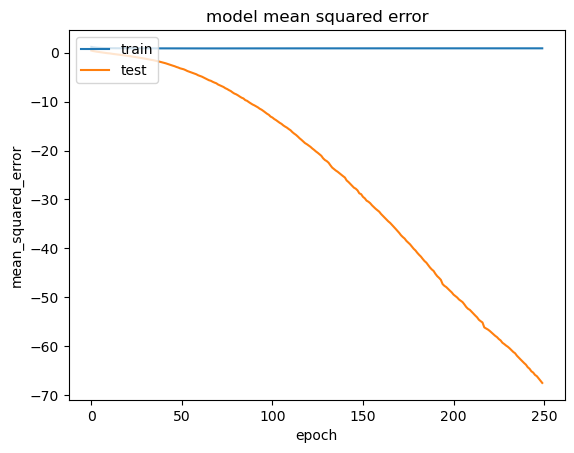

In [77]:
import matplotlib.pyplot as plt
plt.plot(history.history["mean_squared_error"])
plt.plot(history.history["val_loss"])
plt.title("model mean squared error")
plt.ylabel("mean_squared_error")
plt.xlabel("epoch")
plt.legend(["train","test"],loc="upper left")
plt.show()

*  We obtained the best possible and acceptable accuracy with the Keras classifier.